In [1]:
!nvidia-smi

Sun Jul  9 17:51:44 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   51C    P8     9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
import os
HOME = os.getcwd()
print(HOME)

/content


In [3]:
!pip install ultralytics==8.0.28

from IPython import display
display.clear_output()

In [4]:
import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.28 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 24.2/78.2 GB disk)


In [5]:
from ultralytics import YOLO

from IPython.display import display, Image

In [6]:
!mkdir {HOME}/datasets
%cd {HOME}/datasets

!pip install roboflow --quiet

/content/datasets
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.0/57.0 kB 2.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 155.3/155.3 kB 5.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 4.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.6/55.6 kB 5.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 6.4 MB/s eta 0:00:00


#Custom Training

In [7]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="q61nJfFbTDejcrancuu6")
project = rf.workspace("plasticlabel").project("plastic_detection-mnwzz")
dataset = project.version(5).download("yolov5")


loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Plastic_detection-5 in yolov5pytorch:: 100%|██████████| 489/489 [00:00<00:00, 1376.51it/s]


In [8]:
%cd {HOME}

!yolo task = detect mode= train model= yolov8n.pt data = {dataset.location}/data.yaml epochs=100 imgsz=640

/content
100% 6.23M/6.23M [00:00<00:00, 84.3MB/s]
Ultralytics YOLOv8.0.28 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
yolo/engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/datasets/Plastic_detection-5/data.yaml, epochs=100, patience=50, batch=16, imgsz=640, save=True, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False, optim

/content


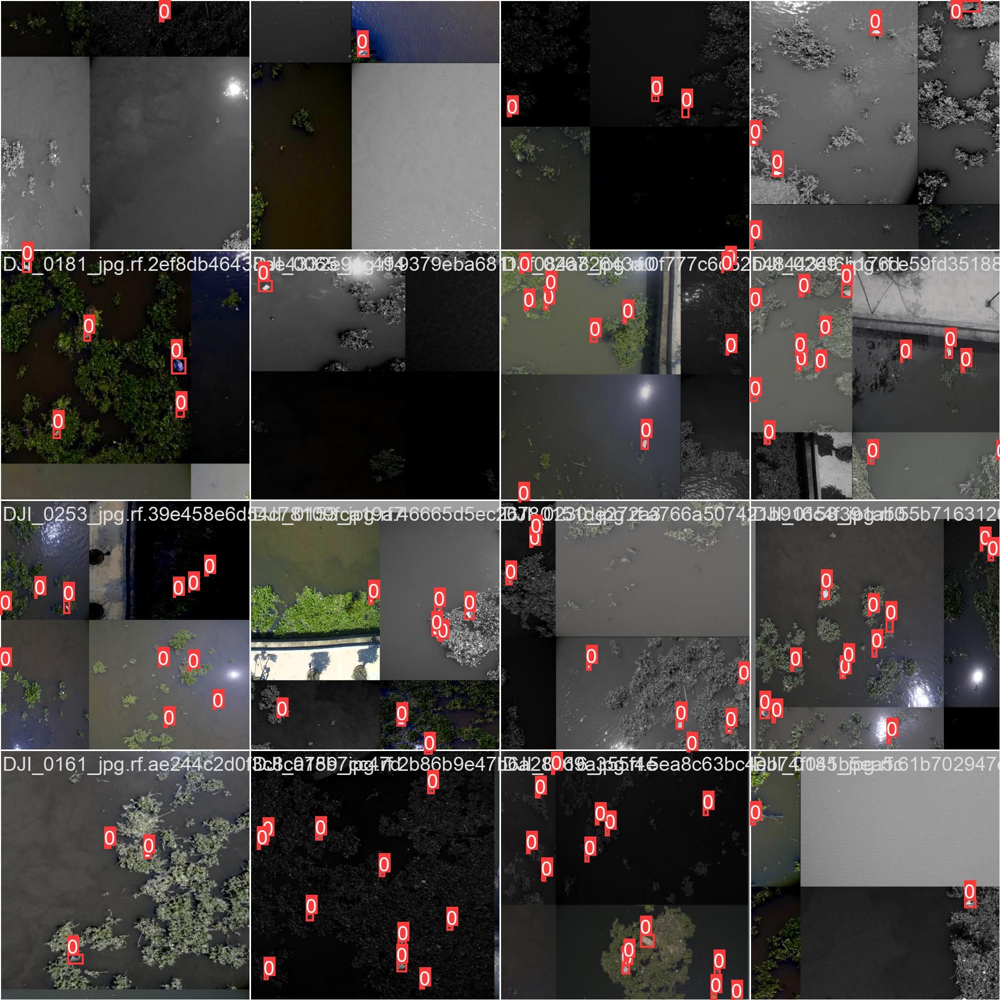

In [12]:
%cd {HOME}

Image(filename=f'{HOME}/runs/detect/train/train_batch0.jpg', width=600)

#Validation

In [13]:
%cd {HOME}

!yolo task=detect mode=val model=/content/runs/detect/train/weights/best.pt data=/content/datasets/Plastic_detection-5/data.yaml

/content
2023-07-09 18:11:38.473062: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-07-09 18:11:39.569551: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Ultralytics YOLOv8.0.28 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs
val: Scanning /content/datasets/Plastic_detection-5/valid/labels.cache... 30 images, 0 backgrounds, 0 corrupt: 100% 30/30 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 2/2 [00:01<00:00,  1.38it/s]
                   all         30        204      0.629      0.696      0.672      0.295
Speed: 0.2ms pre-process, 9.1ms infer

/content


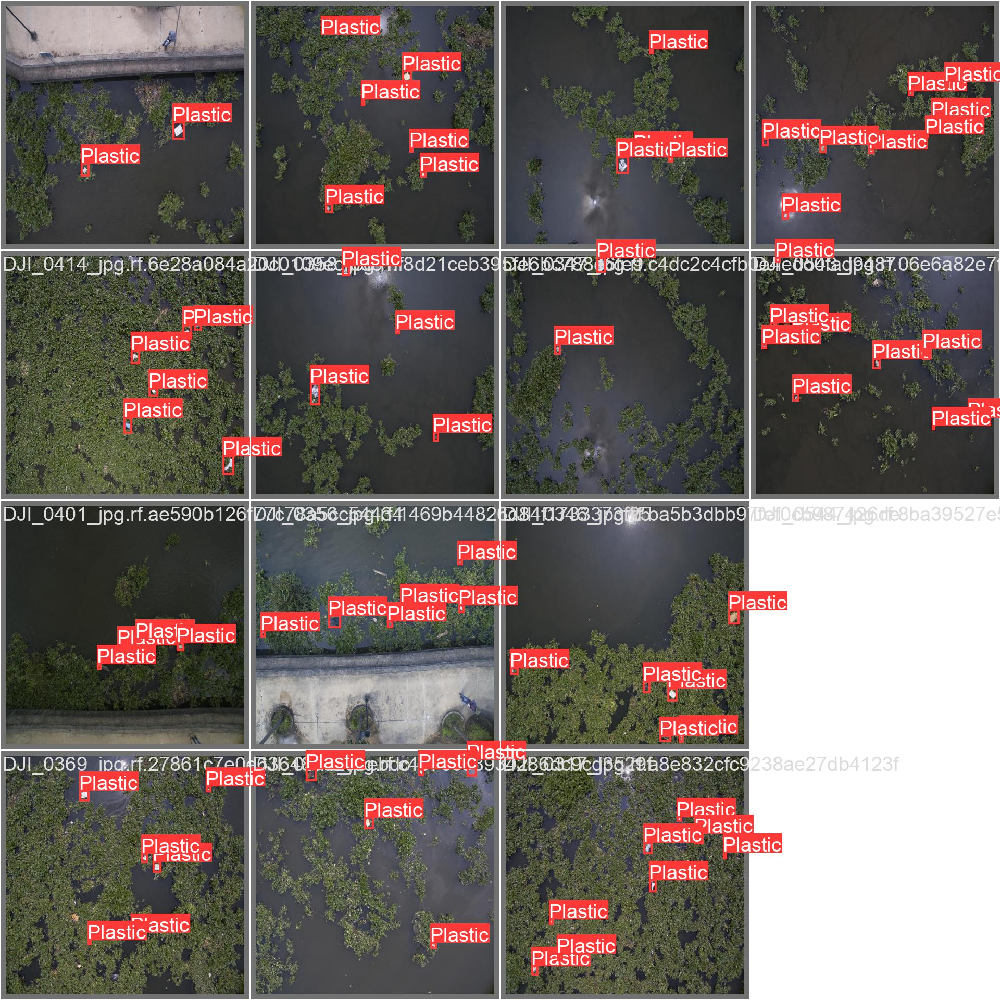

In [14]:
%cd {HOME}

Image(filename=f'{HOME}/runs/detect/val/val_batch1_labels.jpg', width=600)

In [15]:
%cd {HOME}

!yolo task=detect mode=predict model=/content/runs/detect/train/weights/best.pt data='/content/drive/MyDrive/AI Hackathon REVA University/Predict'


/content
WARNING ⚠️ 'source=' is missing. Using default 'source=https://ultralytics.com/images/bus.jpg'.
2023-07-09 18:12:23.806725: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-07-09 18:12:24.642547: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Ultralytics YOLOv8.0.28 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs

100% 476k/476k [00:00<00:00, 14.1MB/s]
image 1/1 /content/bus.jpg: 640x480 4 Plastics, 50.8ms
Speed: 0.6ms pre-process, 50.8ms inference, 89.1ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict


In [16]:
!yolo predict model=/content/runs/detect/train/weights/best.pt source="/content/drive/MyDrive/AI Hackathon REVA University/Predict"

2023-07-09 18:13:03.206668: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-07-09 18:13:04.064682: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Ultralytics YOLOv8.0.28 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs

image 1/10 /content/drive/MyDrive/AI Hackathon REVA University/Predict/DJI_0023.jpg: 480x640 14 Plastics, 51.7ms
image 2/10 /content/drive/MyDrive/AI Hackathon REVA University/Predict/DJI_0080.jpg: 480x640 11 Plastics, 7.5ms
image 3/10 /content/drive/MyDrive/AI Hackathon REVA University/Predict/DJI_0088.jpg: 480x640 6 Plastics, 7.7ms
image 4/10 /content/drive/MyDrive/AI Hackathon REVA Universit

/content


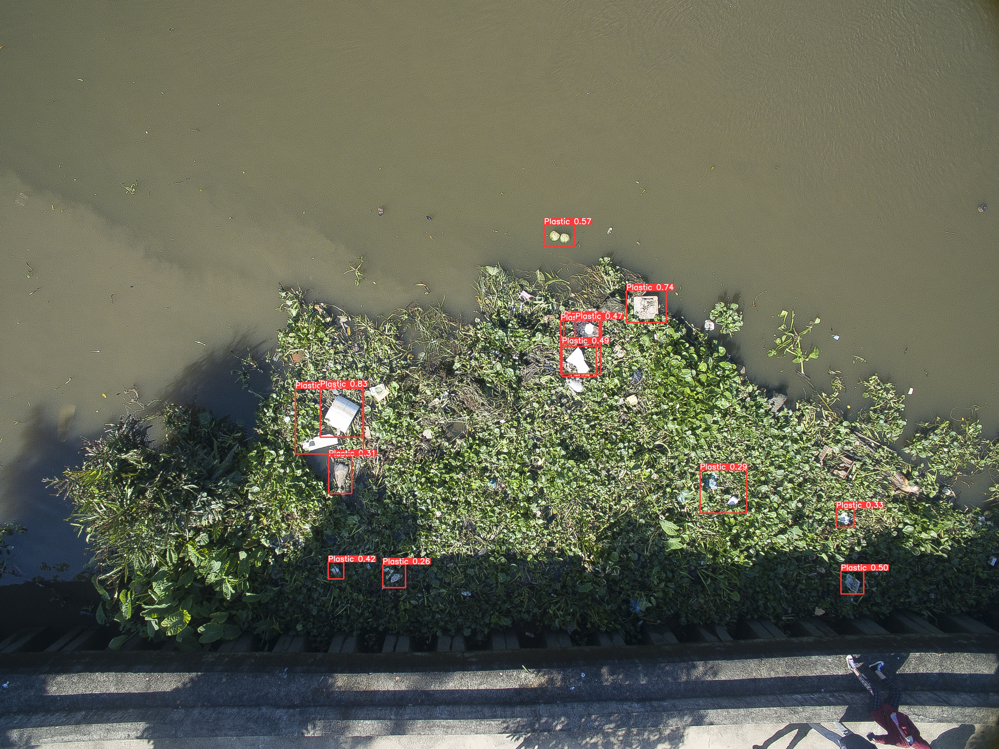

In [17]:
%cd {HOME}

Image(filename=f'{HOME}/runs/detect/predict2/DJI_0023.jpg', width=600)